# Preprocessing and annotation
all filtering steps, clustering and integration of scRNA with inSitu data.  

**Main output:**
- Filtered, preproccessed and clustered inSitu adata file [tap1_harmonized_dist-0.01_spread-1.h5ad]({output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1.h5ad)
- First pass annotated inSitu adata after signature transfer from scRNA data [tap1_harmonized_dist-0.01_spread-1_annotated.h5ad]({output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1_annotated.h5ad)
- Fully annotated inSitu adata with finer annotation of lymphoid subclusters [tap1_harmonized_dist-0.01_spread-1_fine_annotated.h5ad]({output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1_fine_annotated.h5ad)


Please note that the computationally intensive steps were performed on a GPU accelrated server with 'rapids-single cell'.  
Clustering might not reproduce 1:1 when run with scanpy or on a different machine. (not tested)

In [1]:
from auxFns import styles as sy
from auxFns import tap1_auxfns

import math
import numpy as np
import polars as pl
import scanpy as sc
import pandas as pd
import anndata as ad
import seaborn as sns
import plotnine as pn
from plotnine import ggplot, aes

import matplotlib.pyplot as plt
#import rapids_singlecell as rsc

In [3]:
path_to_source_data = '/home/ubuntu/code/notebooks/tickets/TAP1/data/TAP_DFCI_rep2'
path_to_GEO_data = '/home/ubuntu/code/notebooks/tickets/TAP1/data/scRNA'

output_path = '/home/ubuntu/code/notebooks/tickets/TAP1/output'

read unprocessed data

In [4]:
ad_merge = ad.read_h5ad(f'{output_path}/h5ad/inSitu/tap1_adatas_v2_unprocessed.h5ad')
ad_merge.obs['cell_id'] = 'cell_' + ad_merge.obs.index

raw_cell_count = len(ad_merge.obs)
print(f'number of cells, unfiltered: {raw_cell_count}')

/home/ubuntu/.pyenv/versions/3.10.14/lib/python3.10/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.


number of cells, unfiltered: 327826


### filter out cells with total counts above 95th percentile of sample

In [5]:
df = pl.from_pandas(ad_merge.obs)

percentiles = (df.group_by("sample_id").agg([
        pl.col("total_counts").quantile(0.95).alias("percentile_95")
    ])
)

# Step 2: Join the percentiles back to the original DataFrame
df_with_percentiles = df.join(percentiles, on="sample_id")

# # Step 3: Filter out rows where 'total_counts' is above the 95th percentile
cells_keep = df_with_percentiles.filter(pl.col("total_counts") <= pl.col("percentile_95"))['cell_id']

ad_merge = ad_merge[ad_merge.obs['cell_id'].isin(cells_keep)]

In [6]:
print(f'number of cells, filtered after trimming 95th percentile: {raw_cell_count - len(ad_merge.obs)}')

number of cells, filtered after trimming 95th percentile: 16056


### QC overview

plot total counts per gene

/tmp/ipykernel_9840/2394462931.py:8: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


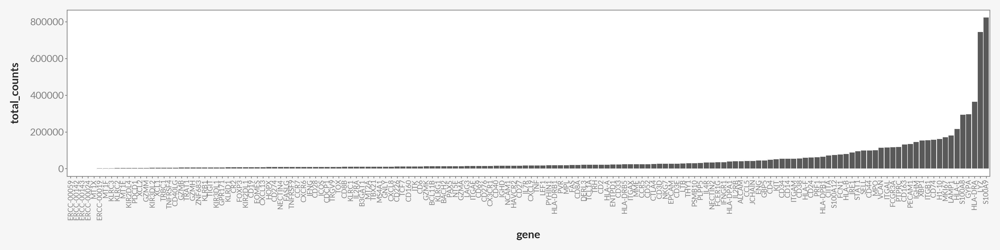

In [14]:
# Calculate the total counts per gene
total_counts_per_gene = np.sum(ad_merge.X, axis=0)

# Convert to a numpy array if it's not already one
total_counts_per_gene = np.array(total_counts_per_gene).flatten()

# If you want to add this information to your AnnData object
ad_merge.var['total_counts'] = total_counts_per_gene
ad_merge.var['ERCC'] = ad_merge.var_names.str.startswith("ERC")

df = pl.from_pandas(ad_merge.var.reset_index(names='gene')).sort('total_counts')
df = df.with_columns(pl.col('gene').cast(pl.Categorical))

(
    ggplot(df, aes(x = 'gene', y = 'total_counts'))
    + pn.geom_col()
    + sy.style
    + pn.theme(figure_size=[20,5], 
               axis_text_x=pn.element_text(angle=90, size=10))
)

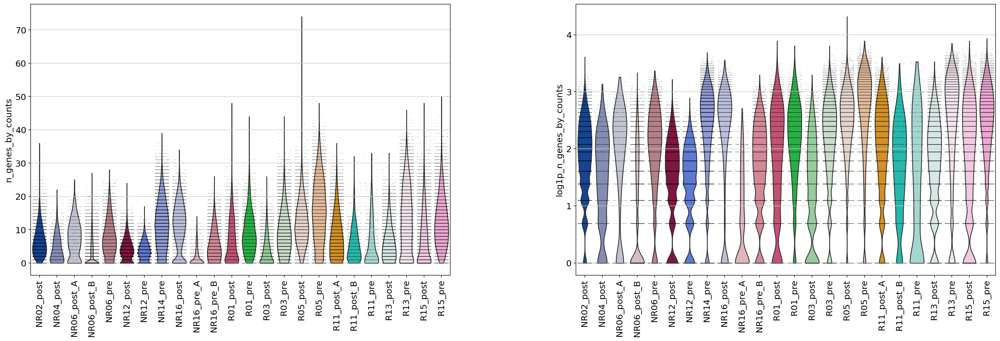

In [17]:
sc.set_figure_params(figsize=[10,8])

sc.pl.violin(
    ad_merge,
    ["n_genes_by_counts", 'log1p_n_genes_by_counts'],
    groupby='sample_id',
    jitter=0.4,
    multi_panel=True,
    size=0.5,
    rotation=90
)

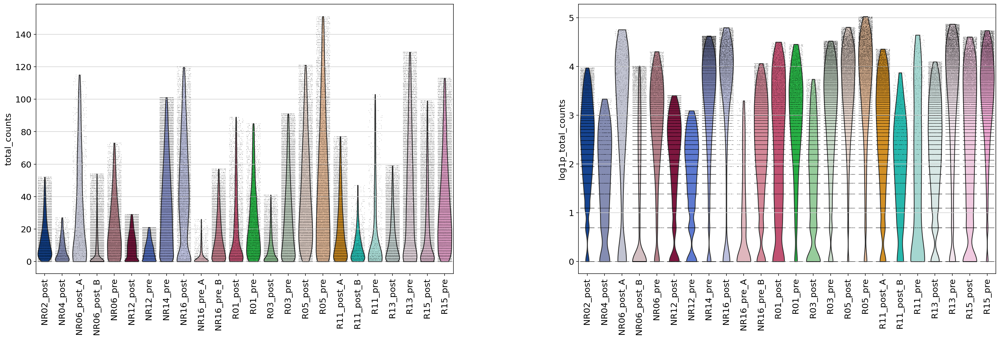

In [18]:
sc.pl.violin(
    ad_merge,
    ["total_counts", 'log1p_total_counts'],
    groupby='sample_id',
    jitter=0.4,
    multi_panel=True,
    size=0.5,
    rotation=90
)

### filter out cells with low counts and few genes as well as genes with low coverage.

In [19]:
sc.pp.filter_cells(ad_merge, min_counts=10, inplace=True)
sc.pp.filter_cells(ad_merge, min_genes=3, inplace=True)
sc.pp.filter_genes(ad_merge, min_cells=5, inplace=True)

print(f'number of cells, filtered after setting count minimum: {raw_cell_count - len(ad_merge.obs)}')

number of cells, filtered after setting count minimum: 133628


### filtering out cells with very tiny and very large segmented nuclei

/home/ubuntu/.pyenv/versions/3.10.14/lib/python3.10/site-packages/plotnine/stats/stat_bin.py:109: PlotnineWarning: 'stat_bin()' using 'bins = 239'. Pick better value with 'binwidth'.


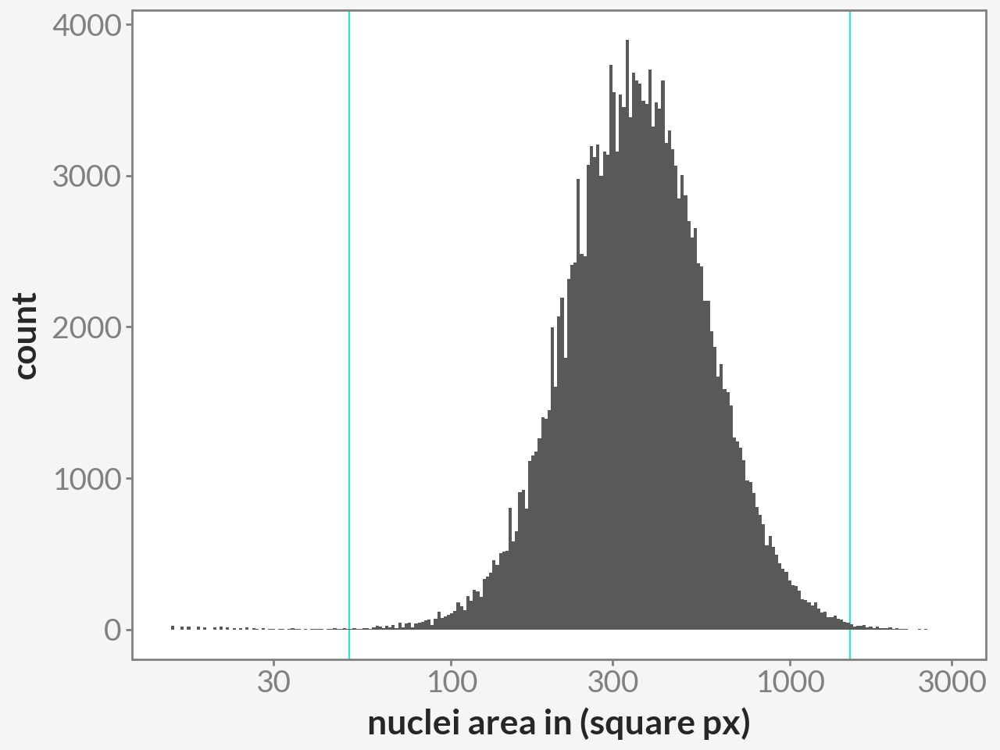

In [20]:
lower_cutoff_px = 50
upper_cutoff_px = 1500

(
    ggplot(ad_merge.obs, aes(x = 'nuclei_area'))
    + pn.geom_vline(xintercept=lower_cutoff_px, color='turquoise')
    + pn.geom_vline(xintercept=upper_cutoff_px, color='turquoise')
    + pn.geom_histogram()
    + pn.scale_x_log10()
    + pn.xlab('nuclei area in (square px)')
    + sy.style
)

conversion from nuclei area in pixels to diameter in microns for better cutoff reporting

In [21]:
lower_cutoff_microns = 2 * (math.sqrt(lower_cutoff_px / math.pi) * 0.325)
upper_cutoff_microns = 2 * (math.sqrt(upper_cutoff_px / math.pi) * 0.325)

print(f'lower limit for nuclear diameter: {lower_cutoff_microns} µm')
print(f'upper limit for nuclear diameter: {upper_cutoff_microns} µm')

lower limit for nuclear diameter: 2.5931248226093127 µm
upper limit for nuclear diameter: 14.20312959769703 µm


filter out cells based on nuclei cutoff

In [22]:
ad_merge = ad_merge[ad_merge.obs_vector('nuclei_area') > lower_cutoff_px, :]
ad_merge = ad_merge[ad_merge.obs_vector('nuclei_area') < upper_cutoff_px, :]

filtered_cell_count = len(ad_merge.obs)
print(f'number of cells filtered after removing nuclear size outliers: {raw_cell_count-filtered_cell_count}, which is {round(((raw_cell_count-filtered_cell_count) / raw_cell_count)*100, 2)}%')

number of cells filtered after removing nuclear size outliers: 134175, which is 40.93%


### move protein data to obsm and clean up obs

In [17]:
proteins = ad_merge.obs.filter(like='intensity').columns
proteins = [protein.split('_')[0] for protein in proteins]
protList = list(set(proteins))
protList

ad_merge.obsm['protein_all'] = ad_merge.obs.filter(like='intensity').copy()
ad_merge.obsm['protein_mean'] = ad_merge.obs.filter(like='intensity_mean').copy()

drop_columns = ad_merge.obs[[col for col in ad_merge.obs.columns if 'intensity_min' in col or 'intensity_max' in col]]
drop_columns

ad_merge.obs = ad_merge.obs.drop(columns=drop_columns)

### pre-process and clustering

In [18]:
ad_merge.layers["counts"] = ad_merge.X.copy()

Please note, some steps were done with rapids-single cell. We have noticed that output is not always identical to scanpy functions.

In [26]:
sc.pp.normalize_total(ad_merge, inplace=True)
sc.pp.log1p(ad_merge)
rsc.pp.pca(ad_merge)
rsc.pp.harmony_integrate(ad_merge, 'run')
rsc.pp.neighbors(ad_merge, use_rep='X_pca_harmony')
rsc.tl.umap(ad_merge, min_dist=0.01, spread=1)
sc.tl.leiden(ad_merge, flavor="igraph", n_iterations=2, directed=False)

# Save file
# ad_merge.write_h5ad(f'{output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1.h5ad')

2024-08-02 16:35:43,513 - harmonypy_gpu - INFO - Iteration 1 of 10
2024-08-02 16:35:48,254 - harmonypy_gpu - INFO - Iteration 2 of 10
2024-08-02 16:35:52,991 - harmonypy_gpu - INFO - Iteration 3 of 10
2024-08-02 16:35:57,737 - harmonypy_gpu - INFO - Converged after 3 iterations


In [24]:
# Read file
ad_merge = ad.read_h5ad(f'{output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1.h5ad')

### visualize clustering results

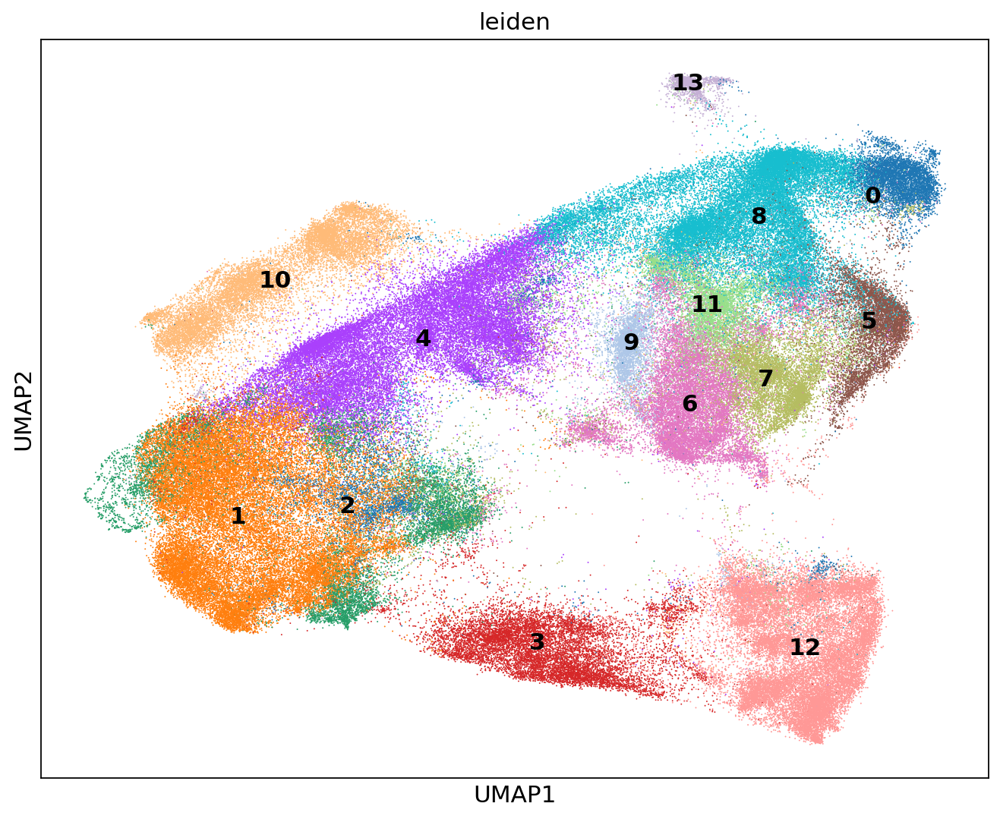

In [25]:
sc.set_figure_params(figsize=[10,8])

sc.pl.umap(
    ad_merge,
    color=["leiden"],
    size=3,
    legend_loc="on data"
)

compute differential gene expression of leiden clusters

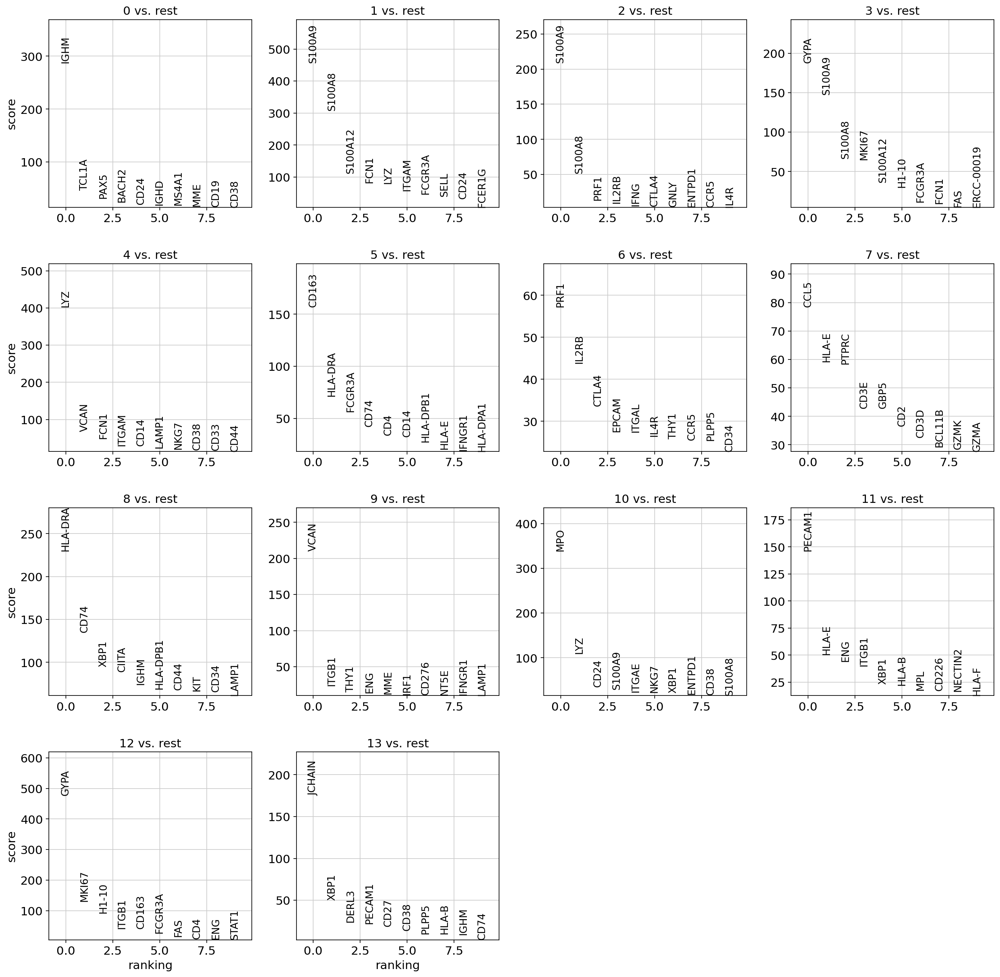

In [26]:
sc.set_figure_params(figsize=[5,5])

sc.tl.rank_genes_groups(ad_merge, "leiden", method="t-test", key_added="leiden_v_rest")
sc.pl.rank_genes_groups(ad_merge, n_genes=10, sharey=False, key="leiden_v_rest", fontsize=12)

extract and save dge results

In [27]:
dge_results = tap1_auxfns.convert_dge_results(adata=ad_merge, key="leiden_v_rest")
dge_results

dge_results.write_csv(f'{output_path}/differential_gene_expression/inSitu_dge_results_leiden_v_rest.csv')

### integrate with scRNA data

In [51]:
# load scRNA data with DGE results stored in adata.uns
adata = ad.read_h5ad(f'{output_path}/h5ad/scRNA/GSE255530_scRNA_data_s3_dge_results.h5ad')

function `tap1_auxfns.filter_deg_genes()` selects top differentially expressed genes from a reference (here scRNA data) 
and checks for overlap with a query gene set (here from in Situ data) and then returns the top 15
this function is called within `tap1_auxfns.mean_score_matrix()` which returns a matrix of cluster transfer scores generated from filtered signatures

In [ ]:
# save signatures to file
transfer_signatures = tap1_auxfns.filter_deg_genes(ref_adata=adata, query_adata=ad_merge, score_key='refined_v_rest', ranking='logfc', top_n=15)
transfer_signatures.write_csv(f'{output_path}/celltype_integration_signatures/scRNA_to_inSitu_ctype_transfer_signatures.csv')

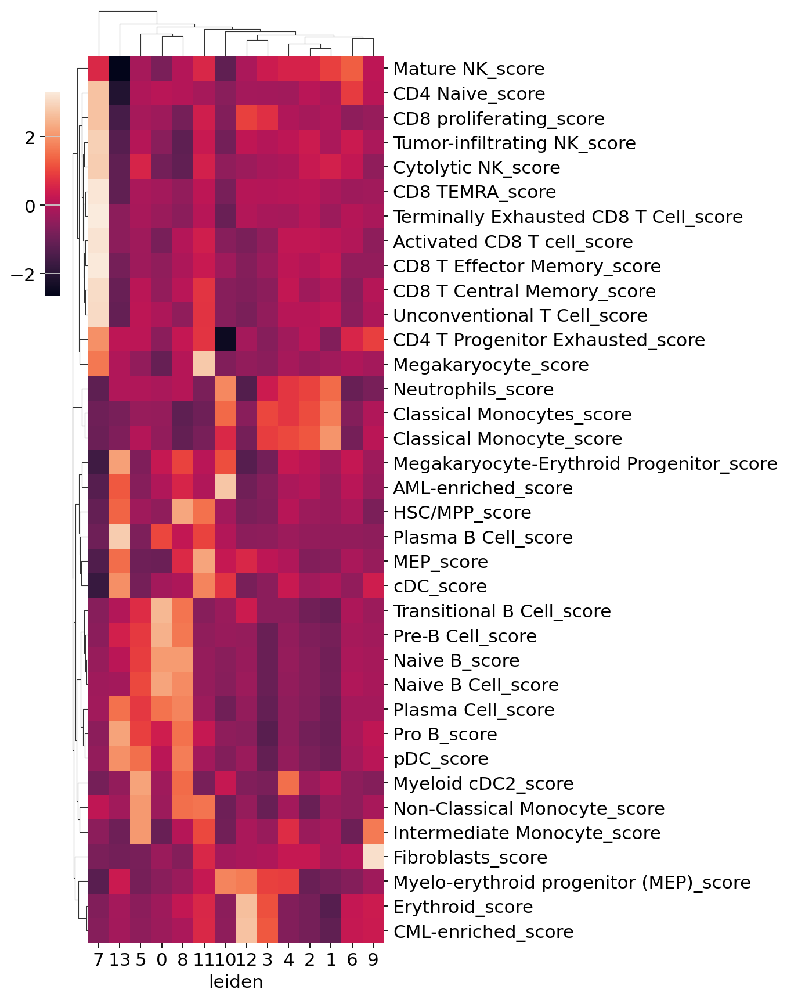

In [84]:
cluster_key = 'leiden'

# takes top-15 genes from scRNA data that are also found in in Situ data and scores the in Situ clusters for each gene set and returns score matrix
mean_scores = tap1_auxfns.mean_score_matrix(
    ref_adata=adata, # scRNA data with DGE results
    query_adata=ad_merge, # query data (in situ)
    score_key="refined_v_rest", # name of DGE comparison in ref_data
    cluster_key=cluster_key, # name of clusters in query_data to be scored
    ranking="logfc", # how should the genes be ranked? 'logFC' or 'score'
    top_n=15, # how many genes to include
    ctrl_sze=25, # size of randomly selected control set
    bins=25, # number of expression bins for gene comparison
)

# plot clustermap
g = sns.clustermap(
    mean_scores.T,
    z_score=0,
    standard_scale=None,
    figsize=(8, 11),
    dendrogram_ratio=0.05,
    cbar_pos=(-0.01, 0.7, 0.02, 0.2),
    cbar_kws={"ticklocation": "left"},
)
# Access the heatmap axes from the seaborn clustermap object
heatmap_ax = g.ax_heatmap
# Remove the gridlines by setting the grid color to white
heatmap_ax.grid(False)
plt.show()

### from the heatmap we can map signatures to leiden clusters and assign them to the inSitu meta data as 'transferred celltypes'

In [85]:
transferred_ctypes = {
    "0": "Transitional B-cell",
    "1": "Monocyte",
    "2": "Monocyte",
    "3": "Erythroid",
    "4": "Myeloid",
    "5": "Macrophage",
    "6": "T-cell",
    "7": "T-cell",
    "8": "Naive B-cell",
    "9": "Fibroblast",
    "10": "AML",
    "11": "Megakaryocyte",
    "12": "Erythroid",
    "13": "Plasma B-cell",
}

ad_merge.obs['transferred_ctype'] = ad_merge.obs['leiden'].map(transferred_ctypes)

## assign a cell id which will help filtering later
ad_merge.obs['cell_id'] = ad_merge.obs['sample_id'].str.cat(ad_merge.obs.index, sep='_', na_rep='')

# Save file
# ad_merge.write_h5ad(f'{output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1_annotated.h5ad')

In [28]:
# Read file
ad_merge = ad.read_h5ad(f'{output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1_annotated.h5ad')

plot results of annotation

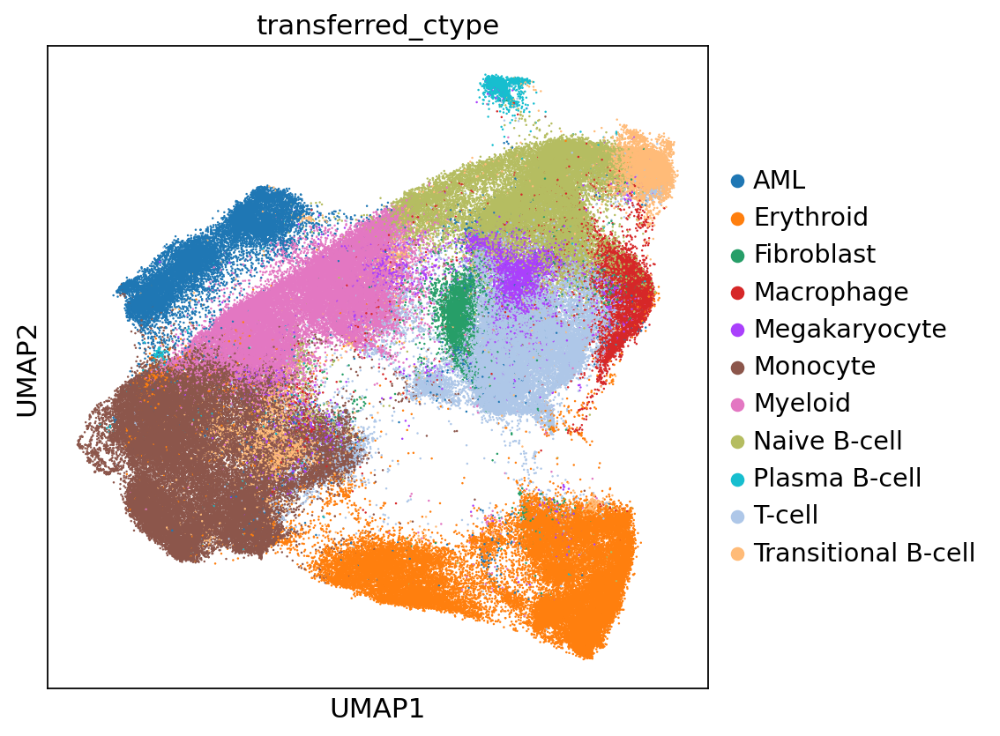

In [29]:
sc.set_figure_params(figsize=[6,6])

sc.pl.umap(
    ad_merge,
    color=['transferred_ctype'],
    size=5,
    palette=sc.pl.palettes.default_20,
)

### check the assigned celltypes for their marker genes

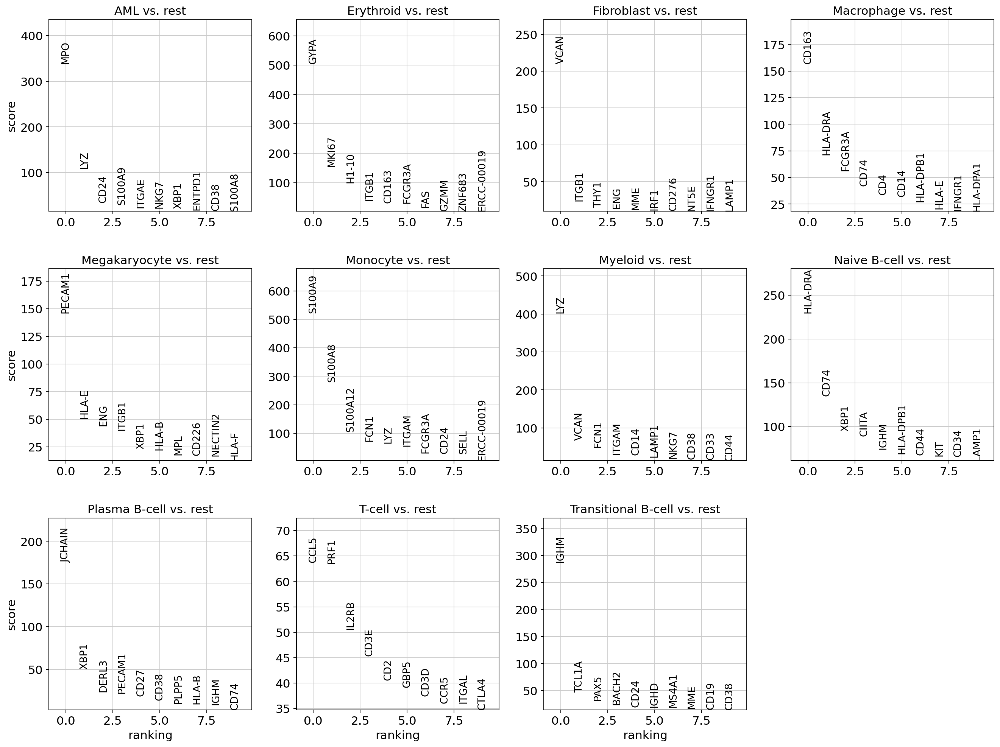

In [30]:
sc.set_figure_params(figsize=[5,5])

sc.tl.rank_genes_groups(ad_merge, "transferred_ctype", method="t-test", key_added="ctype_v_rest")
sc.pl.rank_genes_groups(ad_merge, n_genes=10, sharey=False, key="ctype_v_rest", fontsize=12)

save the DGE results to disk

In [31]:
dge_results = tap1_auxfns.convert_dge_results(adata=ad_merge, key="ctype_v_rest")
dge_results

dge_results.write_csv(f'{output_path}/differential_gene_expression/inSitu_dge_results_transferred_celltype_v_rest.csv')

# Sub-clustering of lymphoid cells for better characterization of T-cell subsets

In [10]:
# Read annotated inSitu adata file
ad_merge = ad.read_h5ad(f'{output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1_annotated.h5ad')

### subset lymphoid group from scRNA data and run DGE on this group

In [66]:
scRNA_lymphoid = adata[adata.obs['cell_group'].isin(['T-cell', 'NK-cell'])].copy()

sc.tl.rank_genes_groups(scRNA_lymphoid, "Refined Cell type", method="wilcoxon", key_added="refined_v_rest")
# scRNA_lymphoid.write_h5ad(f'{output_path}/h5ad/scRNA/GSE255530_scRNA_lymphoid_subset.h5ad')

In [33]:
# Read file
scRNA_lymphoid = ad.read_h5ad(f'{output_path}/h5ad/scRNA/GSE255530_scRNA_lymphoid_subset.h5ad')

### perform sub-clustering of in situ lymphoid data

In [66]:
included_subclusters = ['T-cell']
inSitu_lymphoid = ad_merge[ad_merge.obs['transferred_ctype'].isin(included_subclusters)].copy()

rsc.pp.pca(inSitu_lymphoid)
rsc.pp.harmony_integrate(inSitu_lymphoid, 'run')
rsc.pp.neighbors(inSitu_lymphoid, use_rep='X_pca_harmony')
rsc.tl.umap(inSitu_lymphoid, min_dist=0.01, spread=0.5)
sc.tl.leiden(inSitu_lymphoid, flavor="igraph", n_iterations=2, directed=False, resolution=0.35)

# Save file
# inSitu_lymphoid.write_h5ad(f'{output_path}/h5ad/inSitu/tap1_lymphoid.h5ad')

/home/ubuntu/.pyenv/versions/3.10.4/lib/python3.10/site-packages/rapids_singlecell/preprocessing/_pca.py:177: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
2024-08-02 17:26:06,556 - harmonypy_gpu - INFO - Iteration 1 of 10
2024-08-02 17:26:08,538 - harmonypy_gpu - INFO - Iteration 2 of 10
2024-08-02 17:26:10,013 - harmonypy_gpu - INFO - Iteration 3 of 10
2024-08-02 17:26:10,482 - harmonypy_gpu - INFO - Converged after 3 iterations


In [34]:
# Read file
inSitu_lymphoid = ad.read_h5ad(f'{output_path}/h5ad/inSitu/tap1_lymphoid.h5ad')

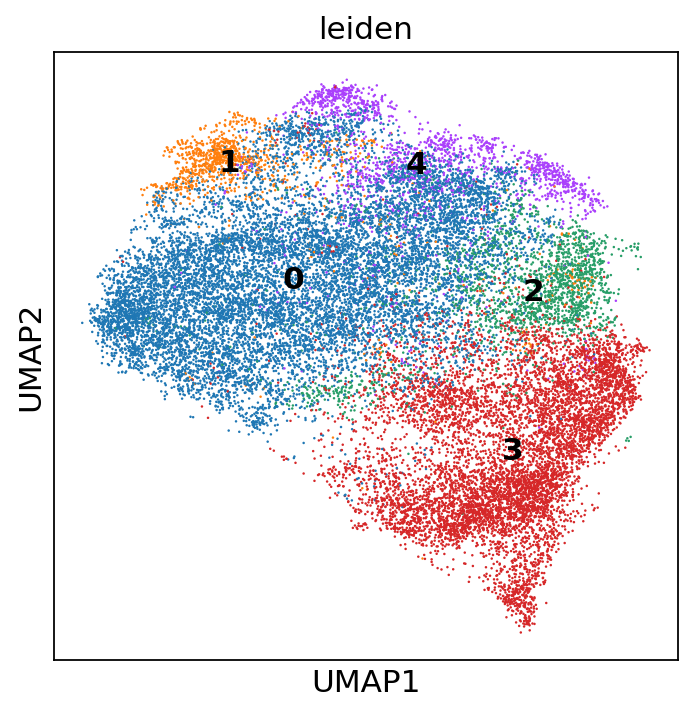

In [35]:
sc.pl.umap(
    inSitu_lymphoid,
    color=['leiden'],
    size=5,
    palette=sc.pl.palettes.default_20,
    legend_loc="on data"
)

repeat celltype transfer approach as above

In [36]:
transfer_signatures = tap1_auxfns.filter_deg_genes(ref_adata=scRNA_lymphoid, query_adata=inSitu_lymphoid, score_key='refined_v_rest', ranking='logfc', top_n=15)
transfer_signatures.write_csv(f'{output_path}/celltype_integration_signatures/scRNA_to_inSitu_lymphoid_ctype_transfer_signatures.csv')

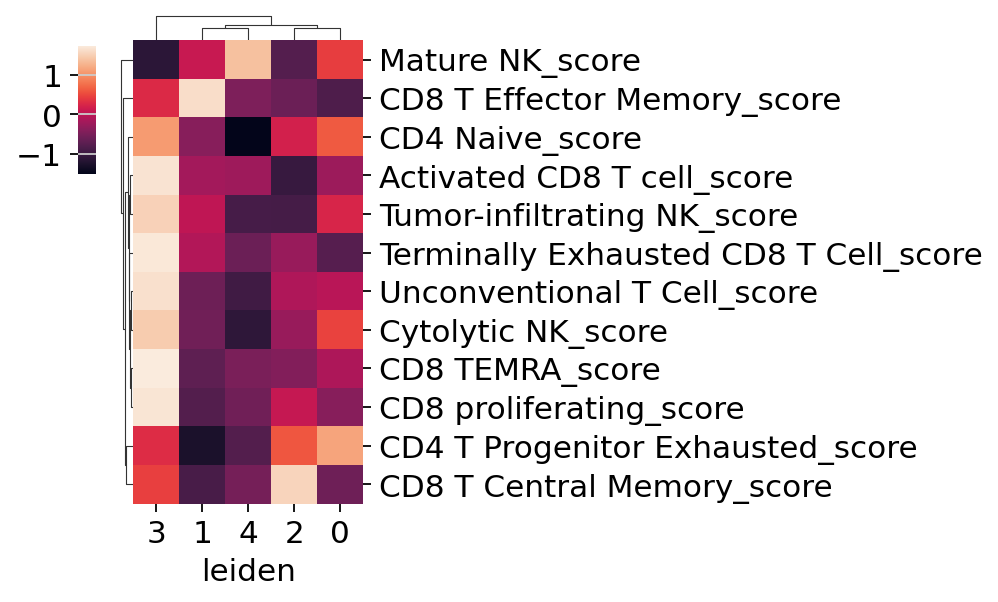

In [37]:
cluster_key = "leiden"

mean_scores = tap1_auxfns.mean_score_matrix(
    ref_adata=scRNA_lymphoid,
    query_adata=inSitu_lymphoid,
    score_key="refined_v_rest",
    cluster_key=cluster_key,
    ranking="logfc",
    top_n=15,
    ctrl_sze=25,
    bins=25,
)

# sns.clustermap(mean_scores.T, z_score=None, standard_scale=0, figsize=(6, 4))
g = sns.clustermap(
    mean_scores.T,
    z_score=0,
    standard_scale=None,
    figsize=(5.8, 4),
    dendrogram_ratio=0.05,
    cbar_pos=(-0.01, 0.7, 0.02, 0.2),
    cbar_kws={"ticklocation": "left"},
)
# Access the heatmap axes from the seaborn clustermap object
heatmap_ax = g.ax_heatmap
heatmap_ax.grid(False)
plt.show()

### map refined T-cell annotations

In [38]:
lymphocyte_assign = {
    '0': 'CD4 T-cell',
    '1': 'CD8 Memory',
    '2': 'CD8 Memory',
    '3': 'CD8 TEMRA',
    '4': 'NK-cell',
}

inSitu_lymphoid.obs['celltype_fine'] = inSitu_lymphoid.obs['leiden'].map(lymphocyte_assign)

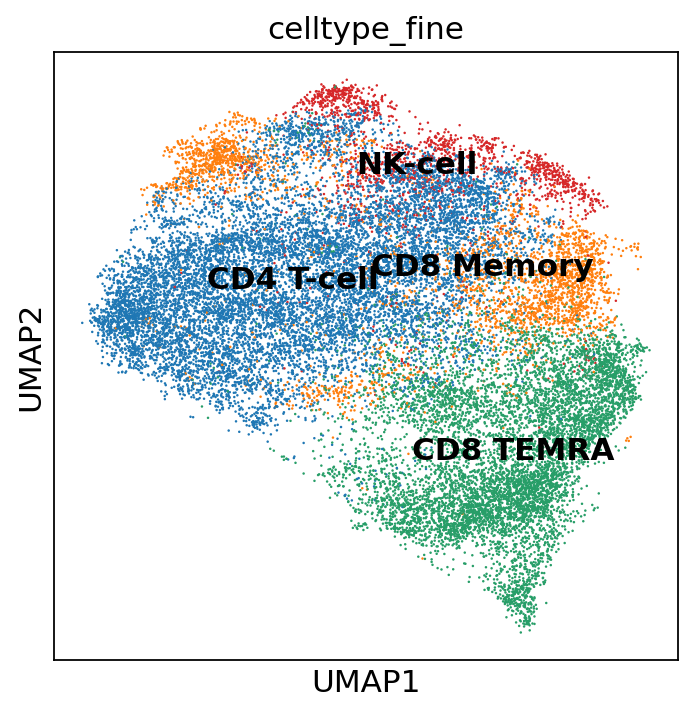

In [39]:
sc.pl.umap(
    inSitu_lymphoid,
    color=['celltype_fine'],
    size=5,
    palette=sc.pl.palettes.default_20,
    legend_loc="on data",
)

### heatmap of GOIs in lymphoid subset

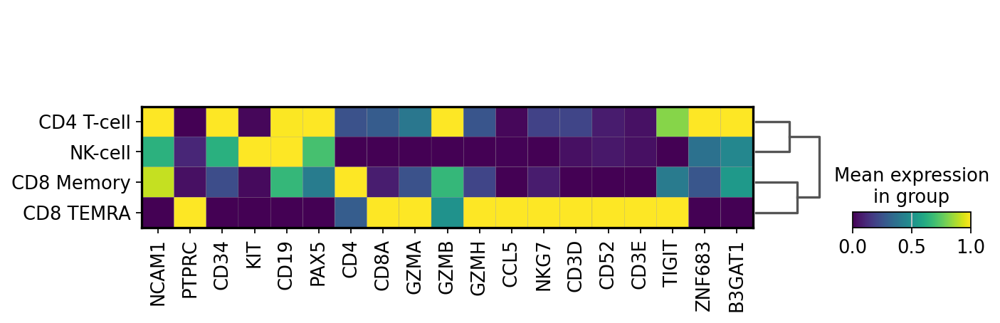

In [44]:
goi = [
    "NCAM1",
    "PTPRC", # CD45RA
    "CD34",
    "KIT", # CD117
    "CD19",
    "PAX5",
    "CD4",
    "CD8A",
    "GZMA",
    "GZMB",
    "GZMH",
    "CCL5",
    "NKG7",
    "CD3D",
    "CD52",
    "CD3E",
    "TIGIT",
    "ZNF683",
    "B3GAT1",
]

sc.pl.matrixplot(
    inSitu_lymphoid,
    var_names=goi,
    groupby="celltype_fine",
    standard_scale="var",
    dendrogram=True,
    #show=False,
)

### The CD8 TEMRA score used to call the celltype plotted on umap

/home/ubuntu/.pyenv/versions/3.10.14/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:916: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

/home/ubuntu/.pyenv/versions/3.10.14/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:916: UserWarning: The palette list has more values (20) than needed (5), which may not be intended.


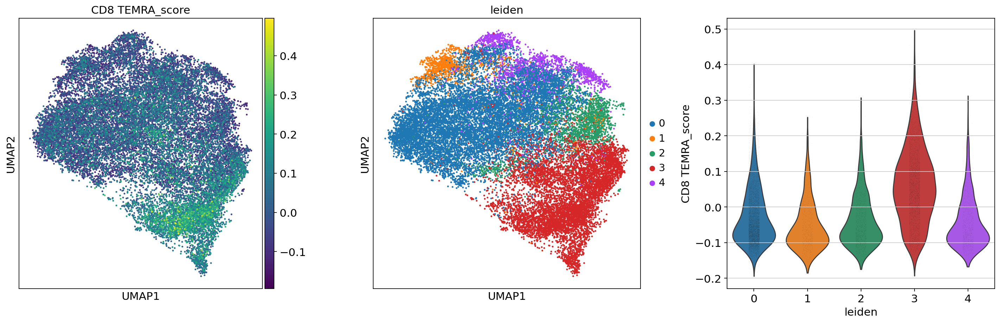

In [47]:
tap1_auxfns.score_from_dge(ref_adata=scRNA_lymphoid, query_adata=inSitu_lymphoid, dge_key='refined_v_rest', cluster_key='leiden', query_score='CD8 TEMRA', top_n=15, pt_size=20)

In [76]:
# Save file
# inSitu_lymphoid.write_h5ad(f'{output_path}/h5ad/inSitu/tap1_lymphoid_annotated.h5ad')

### transfer finer celltype annotation to whole dataset

In [77]:
lymphoid_transfer = inSitu_lymphoid.obs[['cell_id','celltype_fine']]

# Convert to dictionary
result_dict = lymphoid_transfer.set_index('cell_id')['celltype_fine'].to_dict()

ad_merge.obs['celltype_fine'] = ad_merge.obs['cell_id'].map(result_dict)

ad_merge.obs['celltype_fine'] = ad_merge.obs['celltype_fine'].replace('nan', pd.NA).fillna(ad_merge.obs['transferred_ctype'])
ad_merge.obs

,nuclei_area,cell_x,cell_y,nuclei_expanded_area,expanded_cell_x,expanded_cell_y,CD8_intensity_min,CD8_intensity_max,CD8_intensity_mean,HLA-DR_intensity_min,...,cDC_score,Intermediate Monocyte_score,CD8 T Central Memory_score,Megakaryocyte-Erythroid Progenitor_score,Naive B Cell_score,Myelo-erythroid progenitor (MEP)_score,AML-enriched_score,transferred_ctype,cell_id,celltype_fine
2,901.0,639.789123,687.502775,2771.0,639.447131,683.243233,0.0,0.0,0.000000,0.0,...,-0.022213,-0.040335,-0.059479,-0.099959,0.105184,0.053018,-0.147789,Transitional B-cell,R01_post_2,Transitional B-cell
5,766.0,678.298956,725.821149,2312.0,681.508651,726.881920,0.0,0.0,0.000000,0.0,...,0.018984,-0.130963,0.025720,0.052304,-0.060090,-0.077222,0.079806,T-cell,R01_post_5,CD4 T-cell
10,800.0,713.026250,689.468750,2472.0,716.749191,690.717638,0.0,0.0,0.000000,0.0,...,-0.092466,-0.017380,-0.100922,-0.055548,0.092604,-0.043261,-0.007823,T-cell,R01_post_10,CD4 T-cell
16,204.0,799.470588,521.000000,1539.0,799.380767,520.824561,0.0,0.0,0.000000,0.0,...,-0.140123,-0.019938,-0.117145,-0.183623,0.070228,-0.100269,0.120911,T-cell,R01_post_16,CD4 T-cell
21,777.0,1031.899614,731.425997,2869.0,1031.707912,731.074590,0.0,0.0,0.000000,0.0,...,0.195648,0.126007,-0.124841,0.025703,0.017514,-0.014319,-0.059645,T-cell,R01_post_21,CD4 T-cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311741,271.0,33567.405904,5296.354244,1726.0,33567.541715,5296.466976,0.0,443.0,3.985516,0.0,...,-0.003523,0.278016,-0.033955,-0.076510,-0.077286,0.107460,-0.055497,Myeloid,NR16_pre_B_311741,Myeloid
311743,295.0,33674.372881,6301.223729,1770.0,33674.384181,6301.283051,0.0,266.0,2.071186,0.0,...,0.073241,0.073766,-0.035632,-0.019975,-0.109881,0.186695,-0.043678,Myeloid,NR16_pre_B_311743,Myeloid
311746,838.0,33703.125298,6558.894988,2741.0,33702.885078,6557.264137,0.0,356.0,3.986136,0.0,...,0.063239,-0.032611,0.157260,0.037329,-0.108473,0.051981,-0.089424,Myeloid,NR16_pre_B_311746,Myeloid
311748,521.0,33713.679463,6601.976967,2213.0,33713.906462,6602.803886,0.0,293.0,2.799819,0.0,...,-0.123007,-0.158867,-0.115405,-0.025845,0.247069,-0.015567,0.092526,AML,NR16_pre_B_311748,AML


### write out final fully annotated adata file

In [21]:
# ad_merge.write_h5ad(f'{output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1_fine_annotated.h5ad')